# Binary Classification Prediction for type of Breast Cancer

### Description:
Breast cancer is the most common cancer amongst women in the world. It accounts for 25% of all cancer cases, and affected over 2.1 Million people in 2015 alone. It starts when cells in the breast begin to grow out of control. These cells usually form tumors that can be seen via X-ray or felt as lumps in the breast area.

The key challenges against it’s detection is how to classify tumors into malignant (cancerous) or benign(non cancerous). We ask you to complete the analysis of classifying these tumors using machine learning (with SVMs) and the Breast Cancer Wisconsin (Diagnostic) Dataset.

### Dataset: 
a dataset contains data from patients with breast tumors, either benign
or malignant. The data contains many features and each patient has been labelled
as ‘B’ (Benign) or ‘M’ (Malignant).

### The project implementation steps will go as follows:

• Understand the dataset features (attributes)  
• Apply the required data preprocessing methods  
• Build classification models to predict whether the cancer type is Malignant  
or Benign and compare the evaluation metrics of various classification
algorithms.
• Mention your observations and determine which factors are more  
prominent in deciding the type of Breast Cancer.  

## import the Dependencies

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib import cm
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

## 1.Load Data to The DataFrame

In [2]:
BreastCancer=pd.read_csv("breast-cancer.csv")


In [3]:
BreastCancer.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
BreastCancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

### Breast Cancer Dataset Column Descriptions

1. **`id`**: A unique identifier for each patient's record.
2. **`diagnosis`**: The diagnosis of breast tissue, where "M" stands for malignant (cancerous) and "B" stands for benign (non-cancerous).

#### Mean Features (Mean values of measurements taken from cell nuclei images):
3. **`radius_mean`**: Mean of distances from the center to points on the perimeter.
4. **`texture_mean`**: Mean of standard deviation of gray-scale values (texture).
5. **`perimeter_mean`**: Mean size of the perimeter of the nuclei.
6. **`area_mean`**: Mean area of the nuclei.
7. **`smoothness_mean`**: Mean of local variation in radius lengths (smoothness).
8. **`compactness_mean`**: Mean of perimeter² / area - 1.0 (compactness).
9. **`concavity_mean`**: Mean of severity of concave portions of the contour (concavity).
10. **`concave points_mean`**: Mean of the number of concave portions of the contour.
11. **`symmetry_mean`**: Mean symmetry of the nuclei.
12. **`fractal_dimension_mean`**: Mean "coastline approximation" or fractal dimension (1 - dimension).

#### Standard Error Features (Variation in measurements from cell nuclei images):
13. **`radius_se`**: Standard error of the radius.
14. **`texture_se`**: Standard error of texture.
15. **`perimeter_se`**: Standard error of the perimeter.
16. **`area_se`**: Standard error of the area.
17. **`smoothness_se`**: Standard error of smoothness.
18. **`compactness_se`**: Standard error of compactness.
19. **`concavity_se`**: Standard error of concavity.
20. **`concave points_se`**: Standard error of concave points.
21. **`symmetry_se`**: Standard error of symmetry.
22. **`fractal_dimension_se`**: Standard error of fractal dimension.

#### Worst Features (Largest mean values for each feature from cell nuclei images):
23. **`radius_worst`**: Worst or largest mean value for the radius.
24. **`texture_worst`**: Worst texture.
25. **`perimeter_worst`**: Worst perimeter.
26. **`area_worst`**: Worst area.
27. **`smoothness_worst`**: Worst smoothness.
28. **`compactness_worst`**: Worst compactness.
29. **`concavity_worst`**: Worst concavity.
30. **`concave points_worst`**: Worst concave points.
31. **`symmetry_worst`**: Worst symmetry.
32. **`fractal_dimension_worst`**: Worst fractal dimension.



In [5]:
BreastCancer.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

## 2. Exploration Data Analysis

In [6]:
# Drop id as it is not a Feature
BreastCancer = BreastCancer.drop(columns='id' , axis = 1)

In [7]:
BreastCancer.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [8]:
# check on the target column
BreastCancer['diagnosis'].value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

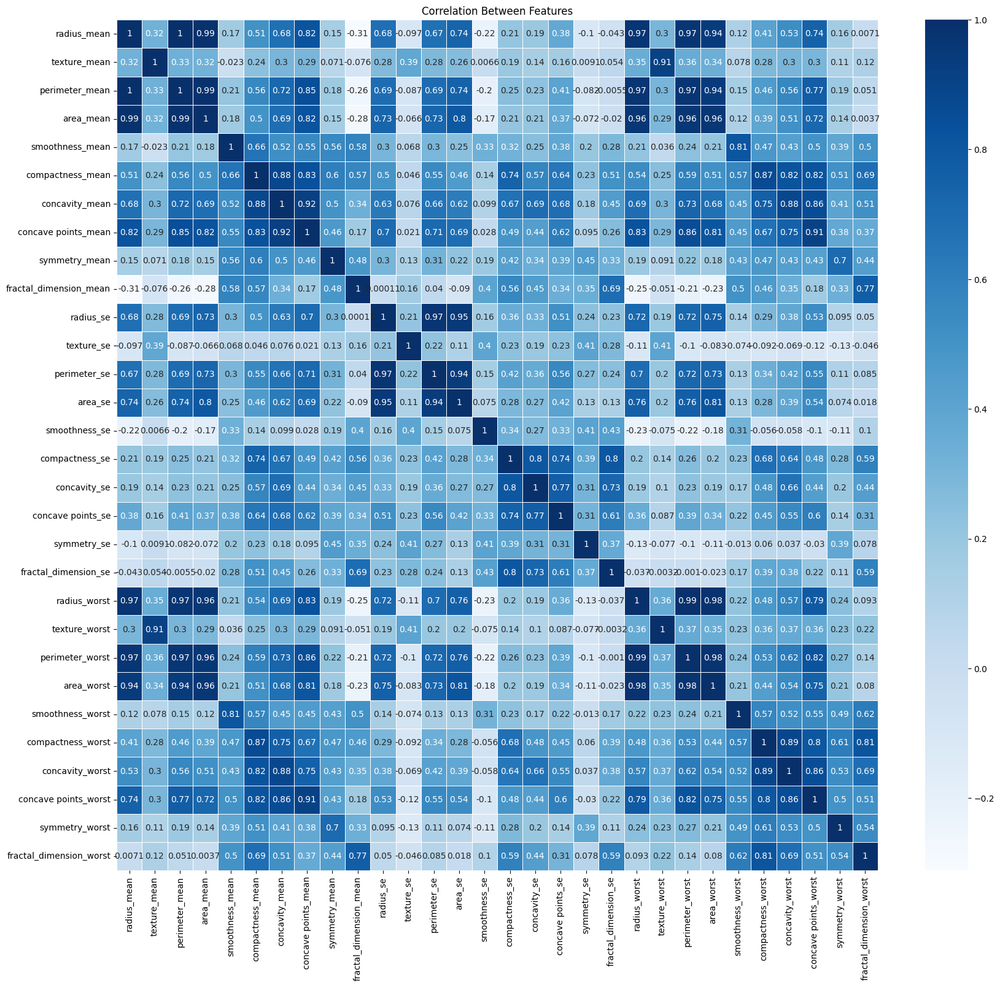

In [9]:
# Make Correlation Matrix to explore the correlation between features
plt.figure(figsize= (20, 18))
sns.heatmap( data = BreastCancer.select_dtypes(include=np.number).corr() , annot = True , linewidth = 0.5 , cmap='Blues')
plt.title('Correlation Between Features')
plt.show()

In [10]:
df_mean=BreastCancer.iloc[:,1:11]
df_mean.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


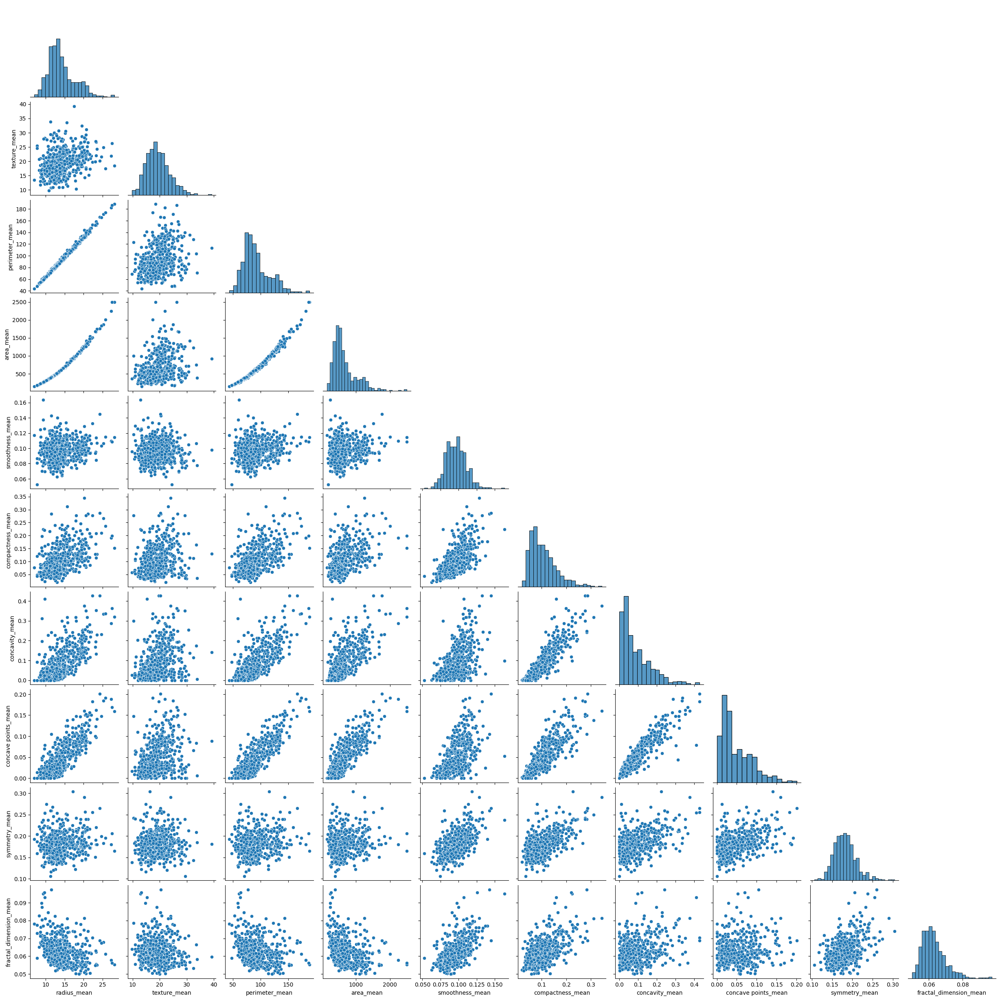

In [11]:
sns.pairplot(df_mean,corner=True)

In [12]:
df_se=BreastCancer.iloc[:,11:21]
df_se.head()

,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
0,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193
1,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532
2,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571
3,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208
4,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115


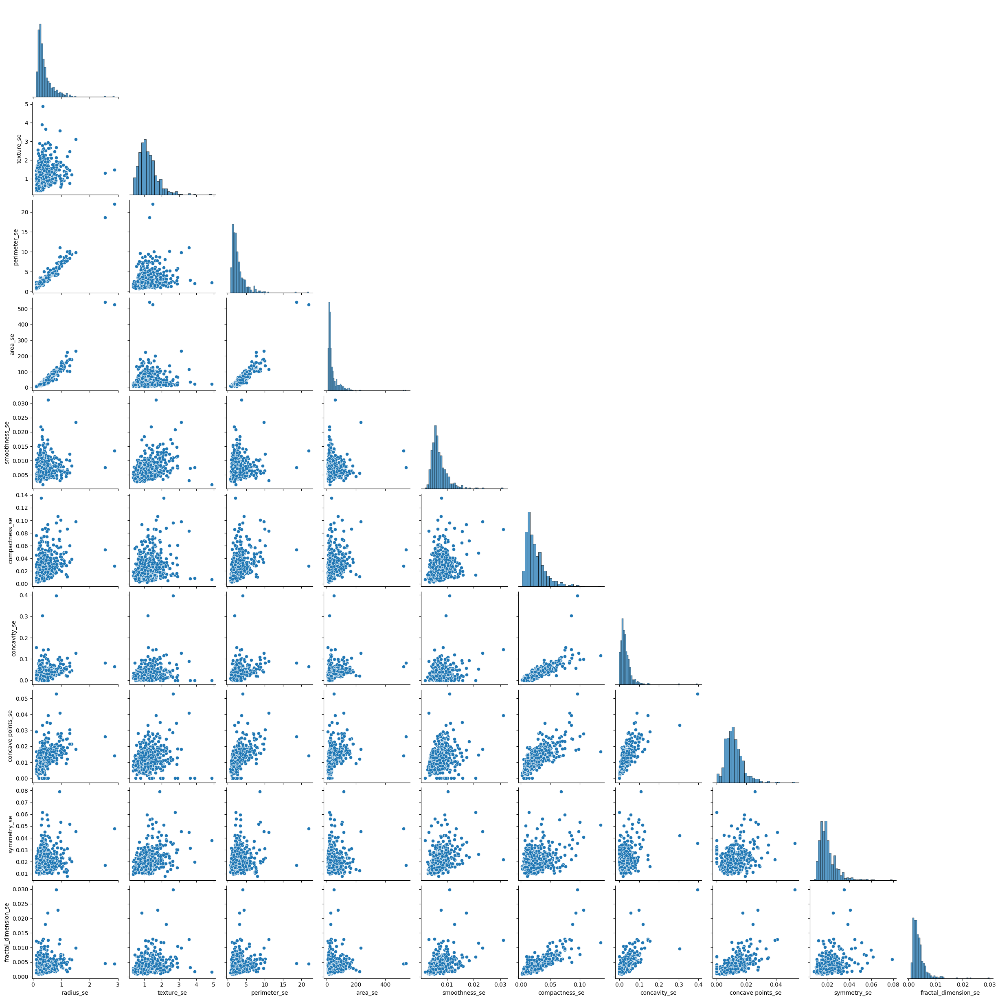

In [13]:
sns.pairplot(df_se,corner=True)

In [14]:
df_worst=BreastCancer.iloc[:,21:]
df_worst.head()

,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


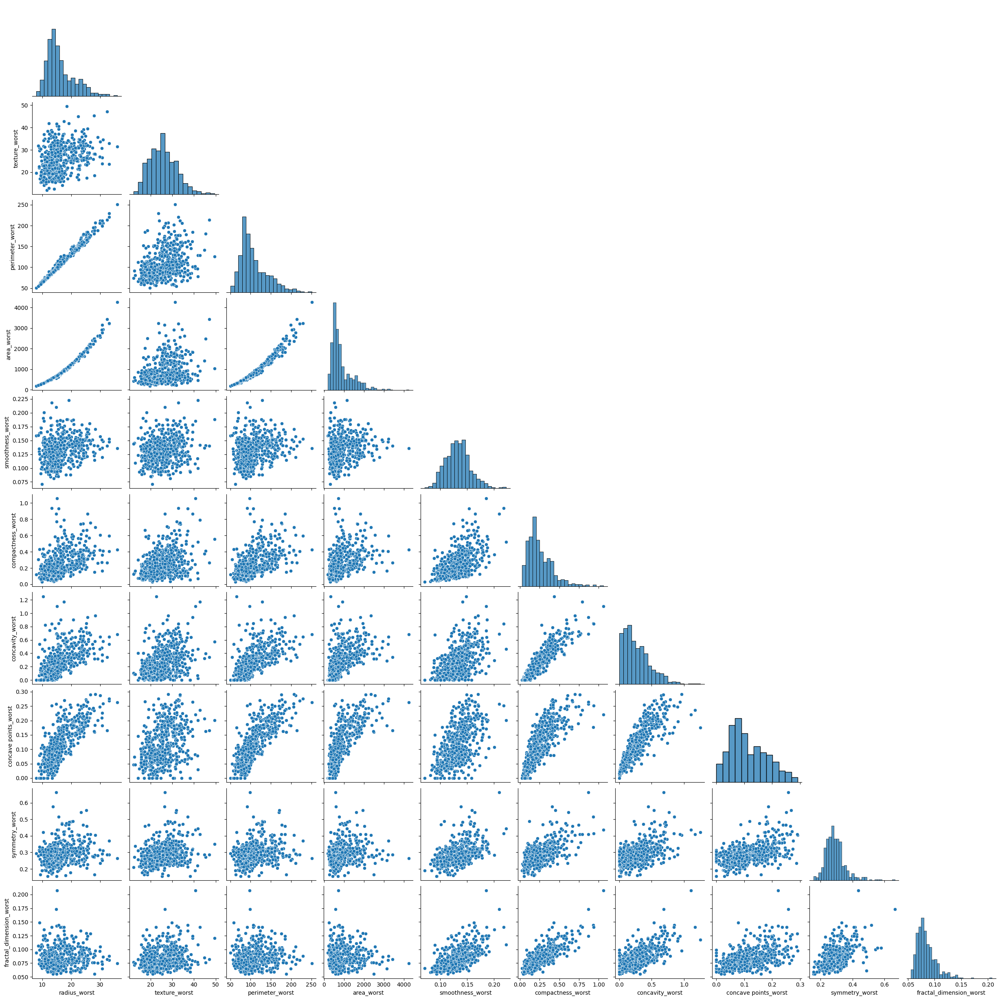

In [15]:
sns.pairplot(df_worst,corner=True)

In [16]:
sns.pairplot(BreastCancer, hue='diagnosis', palette='viridis', corner=True)

### So, we can't make SVM model for this data

array([[<Axes: title={'center': 'radius_mean'}>,
        <Axes: title={'center': 'texture_mean'}>,
        <Axes: title={'center': 'perimeter_mean'}>,
        <Axes: title={'center': 'area_mean'}>,
        <Axes: title={'center': 'smoothness_mean'}>],
       [<Axes: title={'center': 'compactness_mean'}>,
        <Axes: title={'center': 'concavity_mean'}>,
        <Axes: title={'center': 'concave points_mean'}>,
        <Axes: title={'center': 'symmetry_mean'}>,
        <Axes: title={'center': 'fractal_dimension_mean'}>],
       [<Axes: title={'center': 'radius_se'}>,
        <Axes: title={'center': 'texture_se'}>,
        <Axes: title={'center': 'perimeter_se'}>,
        <Axes: title={'center': 'area_se'}>,
        <Axes: title={'center': 'smoothness_se'}>],
       [<Axes: title={'center': 'compactness_se'}>,
        <Axes: title={'center': 'concavity_se'}>,
        <Axes: title={'center': 'concave points_se'}>,
        <Axes: title={'center': 'symmetry_se'}>,
        <Axes: title={'ce

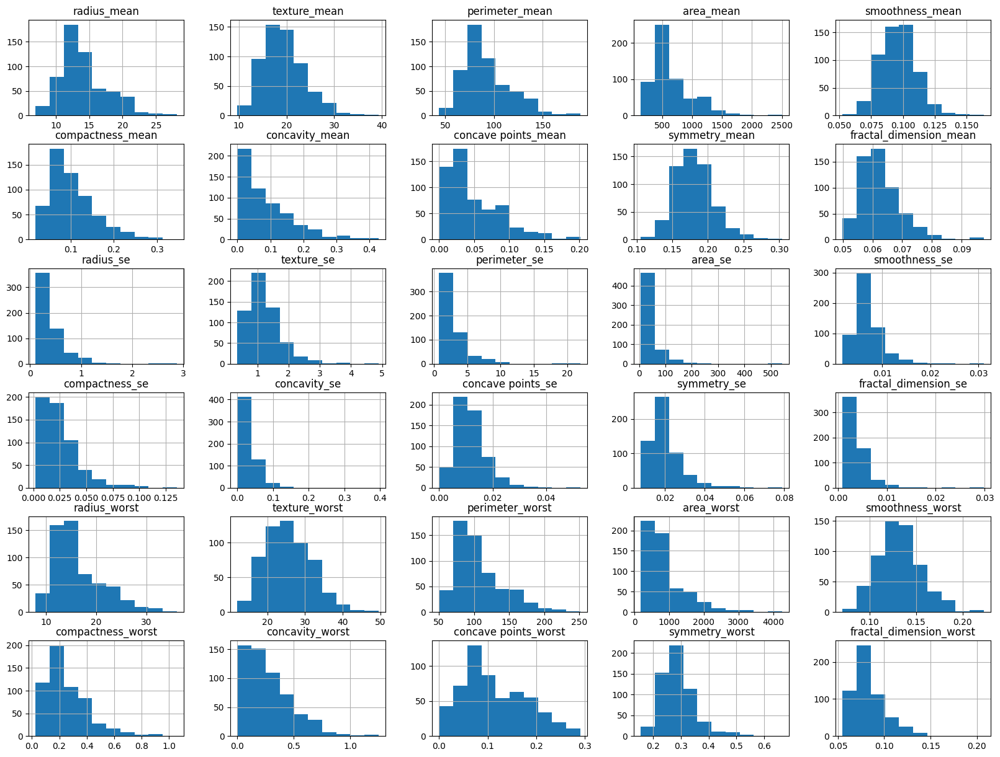

In [17]:
BreastCancer.hist(figsize=(20,15))

## 3.Data Pre Processing

In [18]:
BreastCancer.duplicated().sum()

0

No Duplicates in Data

In [19]:
BreastCancer.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

No Null Values

### Label Encoding
we will encode "diagnosis" as 0 for ‘B’ (Benign) and 1 ‘M’ (Malignant).

In [20]:
BreastCancer['diagnosis']=BreastCancer['diagnosis'].map({ 'B': 0 , 'M' : 1 })

In [21]:
BreastCancer['diagnosis'].value_counts()

diagnosis
0    357
1    212
Name: count, dtype: int64

In [22]:
y=BreastCancer['diagnosis']
X=BreastCancer.drop(columns='diagnosis',axis=1)

In [23]:
X.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### Remove Highly Correlated Features

In [24]:
# Calculate the correlation matrix

CorrMatrix = X.corr().abs()
CorrMatrix

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,0.311631,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.323782,1.000000,0.329533,0.321086,0.023389,0.236702,0.302418,0.293464,0.071401,0.076437,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,0.261477,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,0.283110,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.170581,0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413
fractal_dimension_mean,0.311631,0.076437,0.261477,0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,0.253691,0.051269,0.205151,0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297


In [25]:
# Select Upper triangle of correlation matrix
upper = CorrMatrix.where(np.triu(np.ones(CorrMatrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop highly correlated features
X = X.drop(to_drop, axis=1)

In [26]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              569 non-null    float64
 1   texture_mean             569 non-null    float64
 2   smoothness_mean          569 non-null    float64
 3   compactness_mean         569 non-null    float64
 4   concavity_mean           569 non-null    float64
 5   symmetry_mean            569 non-null    float64
 6   fractal_dimension_mean   569 non-null    float64
 7   radius_se                569 non-null    float64
 8   texture_se               569 non-null    float64
 9   smoothness_se            569 non-null    float64
 10  compactness_se           569 non-null    float64
 11  concavity_se             569 non-null    float64
 12  concave points_se        569 non-null    float64
 13  symmetry_se              569 non-null    float64
 14  fractal_dimension_se     5

Number of features reduced to 20 feature

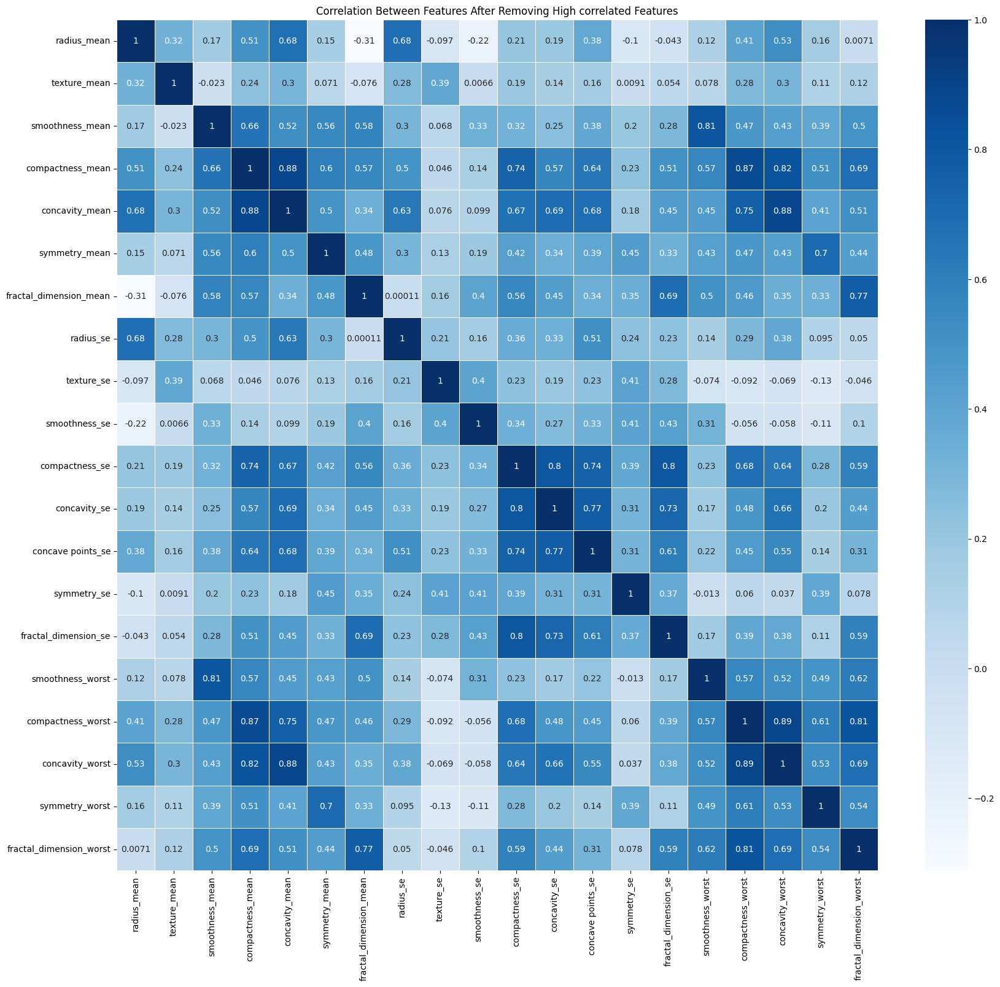

In [27]:
# Make Correlation Matrix to explore the correlation between features
plt.figure(figsize= (20, 18))
sns.heatmap( data = X.select_dtypes(include=np.number).corr() , annot = True , linewidth = 0.5 , cmap='Blues')
plt.title('Correlation Between Features After Removing High correlated Features')
plt.show()

# Features Selection by Random Forest

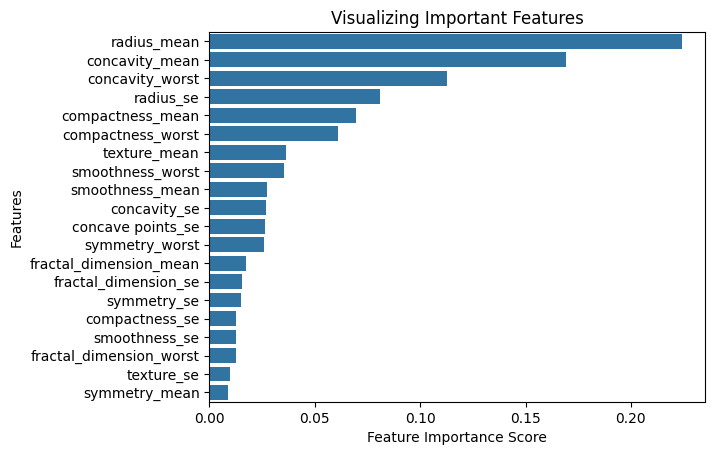

In [28]:
#Split the Data
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split( X , y , test_size=0.2 , random_state=42 , stratify =y)
# instantiate the classifier 
rfc = RandomForestClassifier(random_state=0)

# fit the model
rfc.fit(X_train, y_train)

# Predict the Test set results
y_pred = rfc.predict(X_test)

feature_scores = pd.Series(rfc.feature_importances_, index=X_train.columns).sort_values(ascending=False)
sorted_features = feature_scores.index
sorted_scores = feature_scores.values
sns.barplot(x=feature_scores, y=feature_scores.index, orient = 'h')
# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')

# Add title to the graph
plt.title("Visualizing Important Features")
sorted_features
# Visualize the graph
plt.show()

In [29]:
sorted_features = feature_scores.sort_values(ascending=False)
X = X[sorted_features.index]

# Display the first few rows of the rearranged DataFrame
X.head(25)

,radius_mean,concavity_mean,concavity_worst,radius_se,compactness_mean,compactness_worst,texture_mean,smoothness_worst,smoothness_mean,concavity_se,concave points_se,symmetry_worst,fractal_dimension_mean,fractal_dimension_se,symmetry_se,compactness_se,smoothness_se,fractal_dimension_worst,texture_se,symmetry_mean
0,17.990,0.30010,0.71190,1.0950,0.27760,0.6656,10.38,0.1622,0.11840,0.05373,0.015870,0.4601,0.07871,0.006193,0.03003,0.049040,0.006399,0.11890,0.9053,0.2419
1,20.570,0.08690,0.24160,0.5435,0.07864,0.1866,17.77,0.1238,0.08474,0.01860,0.013400,0.2750,0.05667,0.003532,0.01389,0.013080,0.005225,0.08902,0.7339,0.1812
2,19.690,0.19740,0.45040,0.7456,0.15990,0.4245,21.25,0.1444,0.10960,0.03832,0.020580,0.3613,0.05999,0.004571,0.02250,0.040060,0.006150,0.08758,0.7869,0.2069
3,11.420,0.24140,0.68690,0.4956,0.28390,0.8663,20.38,0.2098,0.14250,0.05661,0.018670,0.6638,0.09744,0.009208,0.05963,0.074580,0.009110,0.17300,1.1560,0.2597
4,20.290,0.19800,0.40000,0.7572,0.13280,0.2050,14.34,0.1374,0.10030,0.05688,0.018850,0.2364,0.05883,0.005115,0.01756,0.024610,0.011490,0.07678,0.7813,0.1809
5,12.450,0.15780,0.53550,0.3345,0.17000,0.5249,15.70,0.1791,0.12780,0.03672,0.011370,0.3985,0.07613,0.005082,0.02165,0.033450,0.007510,0.12440,0.8902,0.2087
6,18.250,0.11270,0.37840,0.4467,0.10900,0.2576,19.98,0.1442,0.09463,0.02254,0.010390,0.3063,0.05742,0.002179,0.01369,0.013820,0.004314,0.08368,0.7732,0.1794
7,13.710,0.09366,0.26780,0.5835,0.16450,0.3682,20.83,0.1654,0.11890,0.02488,0.014480,0.3196,0.07451,0.005412,0.01486,0.030290,0.008805,0.11510,1.3770,0.2196
8,13.000,0.18590,0.53900,0.3063,0.19320,0.5401,21.82,0.1703,0.12730,0.03553,0.012260,0.4378,0.07389,0.003749,0.02143,0.035020,0.005731,0.10720,1.0020,0.2350
9,12.460,0.22730,1.10500,0.2976,0.23960,1.0580,24.04,0.1853,0.11860,0.07743,0.014320,0.4366,0.08243,0.010080,0.01789,0.072170,0.007149,0.20750,1.5990,0.2030


In [30]:
X = X.iloc[ : , : 13]

### Dectict Outliers in Data

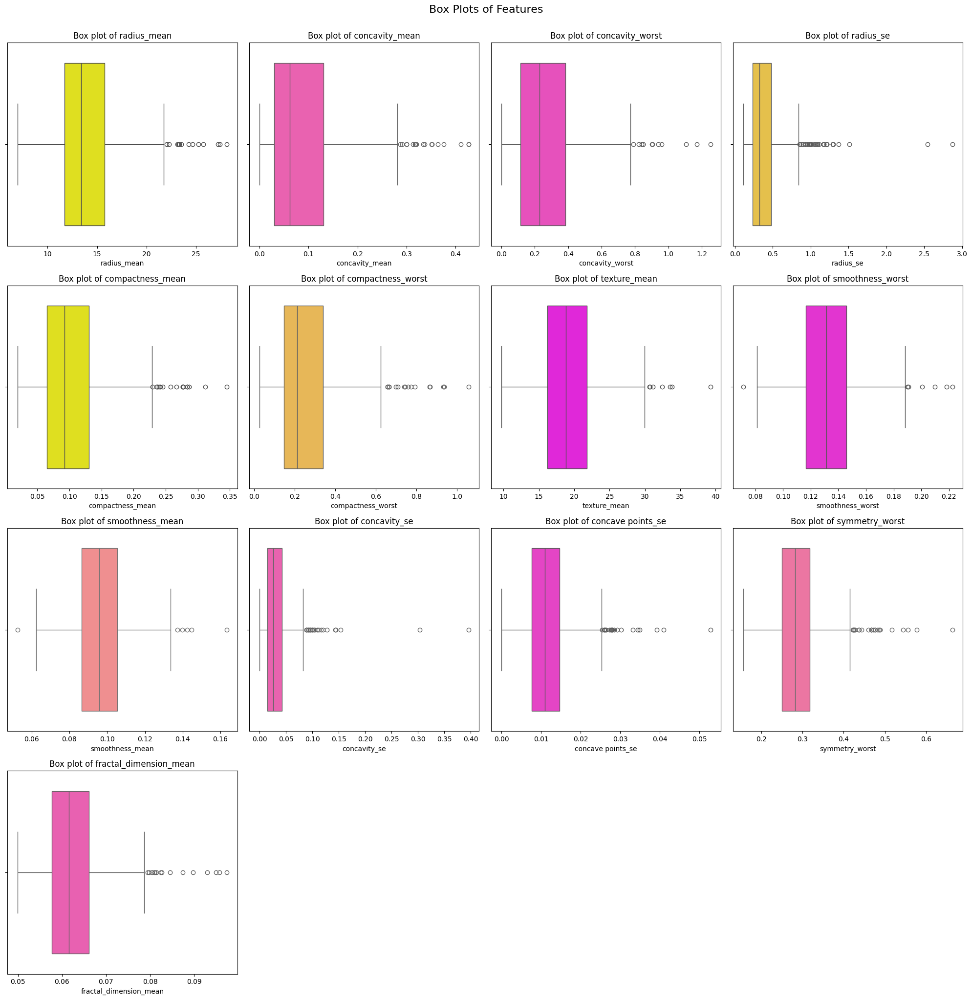

In [31]:
num_colors = 20
indices = np.linspace(0, 400, 1000, dtype=int)
np.random.shuffle(indices)
selected_indices = indices[:num_colors]
colors = [cm.spring(x) for x in selected_indices]
#Box Plot
def print_boxplot(df):
    n = len(df.columns)
    rows = int(np.ceil(n/4))

    fig, axs = plt.subplots(rows, 4, figsize=(20, 5*rows))

    # Flatten the axes array, to make iterating over it easier
    axs = axs.flatten()

    for i, (c, color) in enumerate(zip(df, colors)):
        sns.boxplot(x=df[c],color=color, ax=axs[i])
        axs[i].set_title(f'Box plot of {c}')

    # Remove any unused subplots
    if n % 4:
        for j in range(n, rows*4):
            fig.delaxes(axs[j])

    plt.tight_layout()
    plt.suptitle('Box Plots of Features', x=0.5, y=1.02, fontsize=16)
    plt.show()

print_boxplot(X)

### Feature Scaling
the input numerical attributes have very different scales.  
using StandardScaler to get all attributes to have the same scale

In [32]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

# Fit the scaler to the data and transform the data
X = scaler.fit_transform(X)

In [33]:
X

array([[ 1.13235294,  2.3587107 ,  1.80774963, ...,  0.69852941,
         2.63555556,  2.0391924 ],
       [ 1.76470588,  0.25074155,  0.05551416, ...,  0.34926471,
        -0.10666667, -0.5783848 ],
       [ 1.54901961,  1.34328653,  0.83345753, ...,  1.3645362 ,
         1.17185185, -0.18408551],
       ...,
       [ 0.79166667,  0.30620921,  0.42324888, ...,  0.6561086 ,
        -0.89481481, -0.60095012],
       [ 1.77205882,  2.86592842,  2.65275708, ...,  0.8074095 ,
         1.87407407,  1.02375297],
       [-1.375     , -0.60846352, -0.84463487, ..., -1.54553167,
         0.07259259, -0.32066508]])

### Split Data for Training and Testing

In [34]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split( X , y , test_size=0.2 , random_state=42 , stratify =y)

# Models

## Decision Tree

In [35]:
# instantiate the DecisionTreeClassifier model with criterion gini index
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=6, random_state=42)
# fit the model
clf_gini.fit(X_train, y_train)

y_pred_gini = clf_gini.predict(X_test)

print('Model accuracy score with criterion gini index: {0:0.4f}'. format(accuracy_score(y_test, y_pred_gini)))

# Model_arr
model_arr=[]
# Accuracy_arr
accuracy_arr=[]



y_pred_train_gini = clf_gini.predict(X_train)
y_pred_train_gini


model_arr.append('Decision Tree gini')
accuracy_arr.append(accuracy_score(y_test, y_pred_gini)*100)


print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

cr=classification_report(y_test, y_pred_gini)
print(cr)


Model accuracy score with criterion gini index: 0.9386
Training set score: 0.9868
Test set score: 0.9386
              precision    recall  f1-score   support

           0       0.93      0.97      0.95        72
           1       0.95      0.88      0.91        42

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.93       114
weighted avg       0.94      0.94      0.94       114



In [36]:
cm=pd.DataFrame(confusion_matrix(y_test, y_pred_gini))
cm

,0,1
0,70,2
1,5,37


In [37]:
# instantiate the DecisionTreeClassifier model with criterion gini index
clf_entropy = DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=42)
# fit the model
clf_entropy.fit(X_train, y_train)

y_pred_entropy = clf_entropy.predict(X_test)

print('Model accuracy score with criterion entropy index: {0:0.4f}'. format(accuracy_score(y_test, y_pred_entropy)))

#append the model and accuracy to the data frame 
model_arr.append('Decision Tree entropy')
accuracy_arr.append(accuracy_score(y_test, y_pred_entropy)*100)

print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

cr=classification_report(y_test, y_pred_entropy)
print(cr)

Model accuracy score with criterion entropy index: 0.9298
Training set score: 0.9868
Test set score: 0.9386
              precision    recall  f1-score   support

           0       0.91      0.99      0.95        72
           1       0.97      0.83      0.90        42

    accuracy                           0.93       114
   macro avg       0.94      0.91      0.92       114
weighted avg       0.93      0.93      0.93       114



In [38]:
cm=pd.DataFrame(confusion_matrix(y_test,y_pred_entropy))
cm

,0,1
0,71,1
1,7,35


## Random Forest

In [39]:
RFC = RandomForestClassifier(random_state=42)
RFC.fit(X_train, y_train)


y_pred = RFC.predict(X_test)

model_arr.append('Rondom Forest')
accuracy_arr.append(accuracy_score(y_test, y_pred)*100)

training_accuracy = RFC.score(X_train, y_train)
print("Training Accuracy with 10 decision-trees:", training_accuracy)

# Calculate the testing accuracy
testing_accuracy = RFC.score(X_test, y_test)
print("Testing Accuracy with 10 decision-trees:", testing_accuracy)


cr=classification_report(y_test, y_pred)
print(cr)

Training Accuracy with 10 decision-trees: 1.0
Testing Accuracy with 10 decision-trees: 0.9473684210526315
              precision    recall  f1-score   support

           0       0.93      0.99      0.96        72
           1       0.97      0.88      0.93        42

    accuracy                           0.95       114
   macro avg       0.95      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114



In [40]:
cm=pd.DataFrame(confusion_matrix(y_test, y_pred))
cm

,0,1
0,71,1
1,5,37


## KNN

In [41]:
model=KNeighborsClassifier(n_neighbors=21)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)

model_arr.append('KNN')
accuracy_arr.append(accuracy_score(y_test, y_pred)*100)


# Calculate the training accuracy
training_accuracy = model.score(X_train, y_train)
print("Training Accuracy with 21 neighbors:", training_accuracy)


# Calculate the testing accuracy
testing_accuracy = model.score(X_test, y_test)
print("Testing Accuracy with 21 neighbors:", testing_accuracy)

cr=classification_report(y_test, y_pred)
print(cr)

Training Accuracy with 21 neighbors: 0.9538461538461539
Testing Accuracy with 21 neighbors: 0.9473684210526315
              precision    recall  f1-score   support

           0       0.93      0.99      0.96        72
           1       0.97      0.88      0.93        42

    accuracy                           0.95       114
   macro avg       0.95      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114



In [42]:
cm=pd.DataFrame(confusion_matrix(y_test, y_pred))
cm

,0,1
0,71,1
1,5,37


## Logistic Regression

In [43]:
classifier = LogisticRegression(random_state = 42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

model_arr.append('Logistic Regression')
accuracy_arr.append(accuracy_score(y_test, y_pred)*100)

training_accuracy = classifier.score(X_train, y_train)
print("Training Accuracy:", training_accuracy)


# Calculate the testing accuracy
testing_accuracy = classifier.score(X_test, y_test)
print("Testing Accuracy :", testing_accuracy)

print(classification_report(y_test, y_pred))



Training Accuracy: 0.9846153846153847
Testing Accuracy : 0.9824561403508771
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        72
           1       1.00      0.95      0.98        42

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



In [44]:
cm=pd.DataFrame(confusion_matrix(y_test, y_pred))
cm

,0,1
0,72,0
1,2,40


In [45]:
acc_df=pd.DataFrame(columns=['Model', 'Accuracy'])
acc_df['Model']=model_arr
acc_df['Accuracy']=accuracy_arr

## Accuracy Comparison Between Models

C:\Users\renad\AppData\Local\Temp\ipykernel_7020\3038338502.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0)


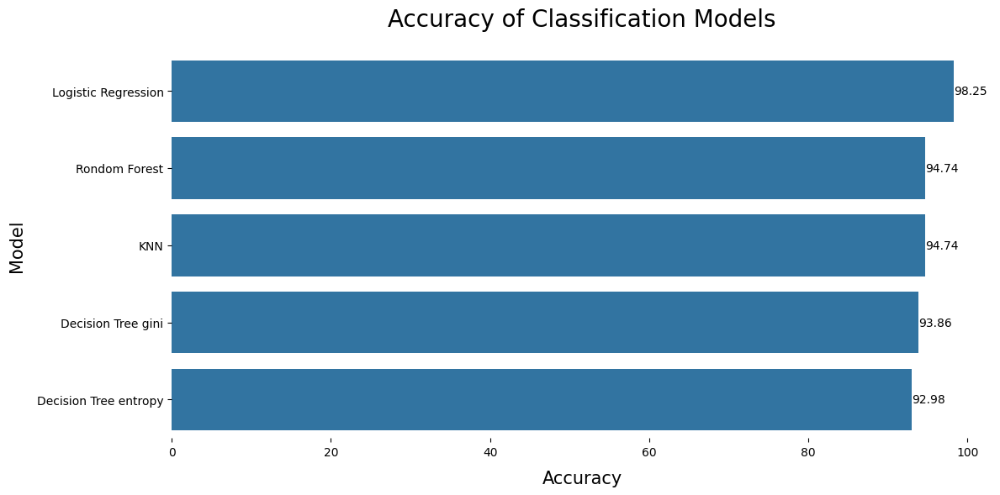

In [46]:

model_arr.append('Rondom Forest')
accuracy_arr.append(accuracy_score(y_test, y_pred))

plt.figure(figsize=(12, 6))
sorted_df = acc_df.sort_values('Accuracy', ascending=False)
ax = sns.barplot(data=sorted_df, y='Model', x='Accuracy', orient ="h")
ax.set_xlabel('Accuracy', fontsize=15, labelpad=10)
ax.set_ylabel('Model', fontsize=15, labelpad=10)
ax.set_title('Accuracy of Classification Models', fontsize=20, y=1.05)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Annotate the bars with their values
for patch in ax.patches:
    x = patch.get_x()
    y = patch.get_y()
    width = patch.get_width()
    height = patch.get_height()
    center_y = y + height / 2
    right_x = x + width
    ax.text(right_x + 0.01, center_y, round(width, 2),
            ha='left', va='center', fontsize=10)
    
plt.show()

# Deployment

In [47]:
import joblib
joblib.dump(scaler, 'scaler.joblib')
joblib_file = 'Binary_Classification_Prediction_for_type_of_Breast_Cancer[1]'
joblib.dump(classifier, joblib_file)
model = joblib.load('scaler.joblib')
# model = joblib.load(open("Binary_Classification_Prediction_for_type_of_Breast_Cancer[1]", 'rb'))
# sample_data = [13.080000, 0.045680, 0.189000, 0.185200, 0.127000, 0.277600,
#                15.710000, 0.131200, 0.107500, 0.016980, 0.006490, 0.318400, 0.068110]
# sample_prediction = model.predict([sample_data])
# print(sample_prediction)